# setup

In [12]:
%load_ext autoreload
%autoreload 2

from __future__ import annotations

from pathlib import Path
from typing import Callable, Sequence

import jax
import jax.numpy as jnp

import compressible.chemistry as chemistry
import compressible.chemistry_utils as chemistry_utils
import compressible.constants as constants
import compressible.energy_models as energy_models
import compressible.transport_models_types as transport_models_types
import compressible.transport_models_utils as transport_models_utils
from compressible.boundary_conditions_utils import (
    build_boundary_arrays_1d,
    build_boundary_arrays_1d_periodic,
)
from compressible.equation_manager import compute_cfl_dt as compute_cfl_dt_unified, run_scan
from compressible.equation_manager_types import EquationManager
from compressible.mesh import Mesh
from compressible.numerics_types import ClippingConfig, NumericsConfig
from compressible.state import compute_U_from_primitives, extract_primitives_from_U

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

pio.templates.default = "plotly_white"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
def make_piecewise_fn(
    x0: float, left: jnp.ndarray | float, right: jnp.ndarray | float, width: float = 0.0
) -> Callable[[jnp.ndarray], jnp.ndarray]:
    left = jnp.asarray(left)
    right = jnp.asarray(right)

    def fn(x: jnp.ndarray) -> jnp.ndarray:
        cond = x < x0
        if left.ndim > 0 or right.ndim > 0:
            cond = cond[..., None]
        if width <= 0.0:
            return jnp.where(cond, left, right)
        blend = 0.5 * (1.0 + jnp.tanh((x - x0) / width))
        if left.ndim > 0 or right.ndim > 0:
            blend = blend[..., None]
        return left * (1.0 - blend) + right * blend

    return fn


def build_grid(n_cells: int, length: float) -> tuple[jnp.ndarray, jnp.ndarray, float]:
    dx = length / n_cells
    x = jnp.linspace(0.5 * dx, length - 0.5 * dx, n_cells)
    x_nodes = jnp.linspace(0.0, length, n_cells + 1)
    return x, x_nodes, dx


def load_species_table(
    species_names: Sequence[str],
    general_data_path: str,
    energy_data_path: str,
) -> chemistry_utils.SpeciesTable:
    energy_cfg = energy_models.EnergyModelConfig(
        model="bird",
        include_electronic=True,
        data_path=str(energy_data_path),
    )

    return chemistry_utils.load_species_table(
        species_names=species_names,
        general_data_path=str(general_data_path),
        energy_model_config=energy_cfg,
    )


def build_equation_manager(
    species_table,
    mesh: Mesh,
    dt: float,
    boundary_condition: str = "outflow",
    reactions=None,
    transport_model_config=None,
    numerics_config=None,
) -> EquationManager:
    if numerics_config is None:
        numerics_config = NumericsConfig(
            dt=dt,
            integrator_scheme="rk2",
            spatial_scheme="muscl",
            flux_scheme="hllc",
            clipping=ClippingConfig(),
        )

    transport_model = None
    if transport_model_config is not None:
        transport_model = transport_models_utils.build_transport_model_from_config(
            transport_model_config,
            species_table=species_table,
        )

    if boundary_condition == "periodic":
        boundary_arrays = build_boundary_arrays_1d_periodic(
            mesh, species_table.n_species
        )
    else:
        boundary_arrays = build_boundary_arrays_1d(
            mesh,
            bc_left=boundary_condition,
            bc_right=boundary_condition,
            n_species=species_table.n_species,
        )

    return EquationManager(
        species=species_table,
        reactions=reactions,
        numerics_config=numerics_config,
        transport_model=transport_model,
        boundary_arrays=boundary_arrays,
    )


def compute_temperature_from_primitives(
    p: jnp.ndarray, rho: jnp.ndarray, Y: jnp.ndarray, M_s: jnp.ndarray
) -> jnp.ndarray:
    M_mix = jnp.sum(Y * M_s[None, :], axis=1)
    return p * M_mix / (rho * constants.R_universal)


def compute_pressure_from_primitives(
    T: jnp.ndarray, rho: jnp.ndarray, Y: jnp.ndarray, M_s: jnp.ndarray
) -> jnp.ndarray:
    M_mix = jnp.sum(Y * M_s[None, :], axis=1)
    return rho * constants.R_universal * T / M_mix


def compute_density_from_primitives(
    T: jnp.ndarray, p: jnp.ndarray, Y: jnp.ndarray, M_s: jnp.ndarray
) -> jnp.ndarray:
    M_mix = jnp.sum(Y * M_s[None, :], axis=1)
    return p * M_mix / (constants.R_universal * T)


def normalize_mole_fractions(Y: jnp.ndarray) -> jnp.ndarray:
    Y = jnp.asarray(Y)
    if Y.ndim == 1:
        Y = Y[:, None]
    Y_sum = jnp.sum(Y, axis=1, keepdims=True)
    return Y / jnp.clip(Y_sum, 1e-14, None)


def build_initial_state(
    x: jnp.ndarray,
    species_table,
    rho_fn: Callable[[jnp.ndarray], jnp.ndarray],
    u_fn: Callable[[jnp.ndarray], jnp.ndarray],
    Y_fn: Callable[[jnp.ndarray], jnp.ndarray],
    p_fn: Callable[[jnp.ndarray], jnp.ndarray] | None = None,
    T_fn: Callable[[jnp.ndarray], jnp.ndarray] | None = None,
    Tv_fn: Callable[[jnp.ndarray], jnp.ndarray] | None = None,
) -> tuple[jnp.ndarray, jnp.ndarray, jnp.ndarray, jnp.ndarray, jnp.ndarray]:
    if p_fn is None and T_fn is None:
        raise ValueError("Provide either p_fn(x) or T_fn(x).")

    rho = rho_fn(x)
    u = u_fn(x)
    Y = normalize_mole_fractions(jnp.asarray(Y_fn(x)))

    if T_fn is None:
        p = p_fn(x)
        T = compute_temperature_from_primitives(p, rho, Y, species_table.molar_masses)
    else:
        T = T_fn(x)
        p = compute_pressure_from_primitives(T, rho, Y, species_table.molar_masses)

    if Tv_fn is None:
        Tv = T
    else:
        Tv = Tv_fn(x)

    return rho, u, T, Tv, Y


def compute_cfl_dt(
    U_init: jnp.ndarray,
    mesh: Mesh,
    eq_manager: EquationManager,
    cfl: float = 0.4,
) -> float:
    eq_manager_cfl = replace(
        eq_manager,
        numerics_config=replace(eq_manager.numerics_config, cfl=cfl),
    )
    return compute_cfl_dt_unified(U_init, mesh, eq_manager_cfl)


def plot_primitives_slices(
    x: jnp.ndarray,
    primitive_slices: list[dict],
    title: str = "Shock Tube Profiles",
):
    fig = make_subplots(
        rows=5,
        cols=1,
        shared_xaxes=True,
        subplot_titles=["rho", "u", "p", "T", "Tv"],
        vertical_spacing=0.06,
    )

    for entry in primitive_slices:
        label = entry["label"]
        rho, u, p, T, Tv = entry["rho"], entry["u"], entry["p"], entry["T"], entry["Tv"]
        fig.add_trace(go.Scatter(x=x, y=rho, name=f"rho {label}"), row=1, col=1)
        fig.add_trace(go.Scatter(x=x, y=u, name=f"u {label}"), row=2, col=1)
        fig.add_trace(go.Scatter(x=x, y=p, name=f"p {label}"), row=3, col=1)
        fig.add_trace(go.Scatter(x=x, y=T, name=f"T {label}"), row=4, col=1)
        fig.add_trace(go.Scatter(x=x, y=Tv, name=f"Tv {label}"), row=5, col=1)

    fig.update_layout(title=title, height=900, width=900, showlegend=True)
    fig.show()


def plot_mole_fractions(
    x: jnp.ndarray,
    Y: jnp.ndarray,
    species_names: Sequence[str],
    title: str,
):
    fig = go.Figure()
    for i, name in enumerate(species_names):
        fig.add_trace(go.Scatter(x=x, y=Y[:, i], name=name))
    fig.update_layout(title=title, height=500, width=900, showlegend=True)
    fig.show()

# run

In [14]:
print("=" * 80)
print("Shock Tube (Williams setup)")
print("=" * 80)

# --- user input start ---
tube_length = 1.0
n_cells = 500
x0 = 0.5 * tube_length
transition_width = 0.0  # set >0 for smooth tanh transition

species_names = ("N2", "N")

T_L = 12000.0
p_L = 2.0e6
u_L = 0.0
Tv_L = T_L
Y_L = jnp.array([1.0, 0.0])

T_R = 1000.0
p_R = 1.0e5
u_R = 0.0
Tv_R = T_R
Y_R = jnp.array([1.0, 0.0])

boundary_condition = "outflow"

use_transport = True
transport_model = "gnoffo"
include_diffusion = True

use_chemistry = True

reference_time = 156e-6
t_final = reference_time
dt = 5e-9
save_interval = 1
# --- user input end ---

x, x_nodes, dx = build_grid(n_cells, tube_length)
mesh = Mesh.from_1d_grid(x_nodes, periodic=boundary_condition == "periodic")

species_table = load_species_table(
    species_names,
    general_data_path="/home/hhoechter/tum/jaxfluids_internship/data/species.json",
    energy_data_path="/home/hhoechter/tum/jaxfluids_internship/data/air_5_bird_energy.json",
)

reactions = None
if use_chemistry:
    reactions_path = (
        Path("/home/hhoechter/tum/jaxfluids_internship")
        / "data"
        / "park_1990_reactions.json"
    )
    chemistry_config = chemistry.ChemistryModelConfig(
        model="park",
        park_vibrational_source="nonpreferential",
        qp_constant=0.3,
        park_alpha=0.5,
    )
    reactions = chemistry_utils.load_reactions_from_json(
        json_path=str(reactions_path),
        species_table=species_table,
        chemistry_model_config=chemistry_config,
    )

transport_config = None
if use_transport:
    data_dir = Path("/home/hhoechter/tum/jaxfluids_internship") / "data"
    transport_config = transport_models_types.TransportModelConfig(
        model=transport_model,
        include_diffusion=include_diffusion,
        collision_integrals_path=(
            str(data_dir / "collision_integrals_tp2867.json")
            if transport_model == "gnoffo" or include_diffusion
            else None
        ),
        casseau_data_path=(
            str(data_dir / "air_5_casseau_transport.json")
            if transport_model == "casseau"
            else None
        ),
    )

numerics_config = NumericsConfig(
    dt=dt,
    integrator_scheme="rk2",
    spatial_scheme="muscl",
    flux_scheme="hllc",
    clipping=ClippingConfig(),
)

rho_L = compute_density_from_primitives(
    jnp.array([T_L]), jnp.array([p_L]), Y_L[None, :], species_table.molar_masses
)[0]
rho_R = compute_density_from_primitives(
    jnp.array([T_R]), jnp.array([p_R]), Y_R[None, :], species_table.molar_masses
)[0]

rho_fn = make_piecewise_fn(x0, rho_L, rho_R, width=transition_width)
u_fn = make_piecewise_fn(x0, u_L, u_R, width=transition_width)
Y_fn = make_piecewise_fn(x0, Y_L, Y_R, width=transition_width)
T_fn = make_piecewise_fn(x0, T_L, T_R, width=transition_width)
Tv_fn = make_piecewise_fn(x0, Tv_L, Tv_R, width=transition_width)

rho, u, T, Tv, Y = build_initial_state(
    x, species_table, rho_fn, u_fn, Y_fn, p_fn=None, T_fn=T_fn, Tv_fn=Tv_fn
)

eq_manager = build_equation_manager(
    species_table=species_table,
    mesh=mesh,
    dt=dt,
    boundary_condition=boundary_condition,
    reactions=reactions,
    transport_model_config=transport_config,
    numerics_config=numerics_config,
)

U_init = compute_U_from_primitives(
    Y_s=Y,
    rho=rho,
    u=u,
    v=jnp.zeros_like(u),
    T_tr=T,
    T_V=Tv,
    equation_manager=eq_manager,
)

U_hist, t_hist = run_scan(
    U_init=U_init,
    mesh=mesh,
    equation_manager=eq_manager,
    t_final=t_final,
    save_interval=save_interval,
)

Shock Tube (Williams setup)


In [15]:
import numpy as np

snapshot_times = jnp.array([0.0, reference_time, t_final])
indices = [int(jnp.argmin(jnp.abs(t_hist - t_target))) for t_target in snapshot_times]

import csv


def load_williams_csv_2col(path):
    xs, ys = [], []
    with open(path) as f:
        reader = csv.reader(f)
        next(reader)
        next(reader)
        for row in reader:
            if row[0]:
                xs.append(float(row[0]))
                ys.append(float(row[1]))
    return xs, ys


def load_williams_csv_4col(path):
    x1, y1, x2, y2 = [], [], [], []
    with open(path) as f:
        reader = csv.reader(f)
        next(reader)
        next(reader)
        for row in reader:
            if row[0]:
                x1.append(float(row[0]))
                y1.append(float(row[1]))
            if row[2]:
                x2.append(float(row[2]))
                y2.append(float(row[3]))
    return (x1, y1), (x2, y2)


csv_dir = "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d"

idx_w = indices[1]
_prim_w = extract_primitives_from_U(U_hist[idx_w], eq_manager)
Y_w, rho_w, T_w, Tv_w, p_w = _prim_w.Y_s, _prim_w.rho, _prim_w.T, _prim_w.Tv, _prim_w.p

(ref_t_x, ref_t_y), (ref_tv_x, ref_tv_y) = load_williams_csv_4col(
    f"{csv_dir}/williams_figure_2.csv"
)
ref_rho_x, ref_rho_y = load_williams_csv_2col(f"{csv_dir}/williams_figure_3.csv")
ref_p_x, ref_p_y = load_williams_csv_2col(f"{csv_dir}/williams_figure_5.csv")
(ref_n_x, ref_n_y), (ref_n2_x, ref_n2_y) = load_williams_csv_4col(
    f"{csv_dir}/williams_figure_4.csv"
)
williams_mole_ref = {"N": (ref_n_x, ref_n_y), "N2": (ref_n2_x, ref_n2_y)}

C_T = "firebrick"
C_TV = "steelblue"
C_N2 = "darkorange"
C_N = "teal"
C_MONO = "black"

lw = dict(width=2)
mk = dict(size=8, symbol="x")

fig = make_subplots(
    rows=2,
    cols=2,
    vertical_spacing=0.14,
    horizontal_spacing=0.10,
)

# (1,1) Density
fig.add_trace(
    go.Scatter(
        x=np.array(x),
        y=np.array(rho_w),
        mode="lines",
        line=dict(color=C_MONO, **lw),
        showlegend=False,
    ),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(
        x=ref_rho_x,
        y=ref_rho_y,
        mode="markers",
        marker=dict(color=C_MONO, **mk),
        showlegend=False,
    ),
    row=1,
    col=1,
)

# (1,2) Pressure
fig.add_trace(
    go.Scatter(
        x=np.array(x),
        y=np.array(p_w),
        mode="lines",
        line=dict(color=C_MONO, **lw),
        showlegend=False,
    ),
    row=1,
    col=2,
)
fig.add_trace(
    go.Scatter(
        x=ref_p_x,
        y=ref_p_y,
        mode="markers",
        marker=dict(color=C_MONO, **mk),
        showlegend=False,
    ),
    row=1,
    col=2,
)

# (2,1) Temperatures
fig.add_trace(
    go.Scatter(
        x=np.array(x),
        y=np.array(T_w),
        mode="lines",
        line=dict(color=C_T, **lw),
        name="T",
        showlegend=True,
    ),
    row=2,
    col=1,
)
fig.add_trace(
    go.Scatter(
        x=np.array(x),
        y=np.array(Tv_w),
        mode="lines",
        line=dict(color=C_TV, **lw),
        name="Tv",
        showlegend=True,
    ),
    row=2,
    col=1,
)
fig.add_trace(
    go.Scatter(
        x=ref_t_x,
        y=ref_t_y,
        mode="markers",
        marker=dict(color=C_T, **mk),
        showlegend=False,
    ),
    row=2,
    col=1,
)
fig.add_trace(
    go.Scatter(
        x=ref_tv_x,
        y=ref_tv_y,
        mode="markers",
        marker=dict(color=C_TV, **mk),
        showlegend=False,
    ),
    row=2,
    col=1,
)

# (2,2) Mole fractions
species_colors = {species_names[0]: C_N2, species_names[1]: C_N}
for i, name in enumerate(species_names):
    c = species_colors.get(name, "gray")
    fig.add_trace(
        go.Scatter(
            x=np.array(x),
            y=np.array(Y_w[:, i]),
            mode="lines",
            line=dict(color=c, **lw),
            name=name,
            showlegend=True,
        ),
        row=2,
        col=2,
    )
    if name in williams_mole_ref:
        rx, ry = williams_mole_ref[name]
        fig.add_trace(
            go.Scatter(
                x=rx, y=ry, mode="markers", marker=dict(color=c, **mk), showlegend=False
            ),
            row=2,
            col=2,
        )

# Dummy: markers = Williams reference
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        mode="markers",
        marker=dict(color="black", size=8, symbol="x"),
        name="Williams reference",
        showlegend=True,
    )
)

_ax_x = dict(
    title_font=dict(size=22), tickfont=dict(size=18), tickangle=0, title_text="x [m]"
)
_ax_y = dict(title_font=dict(size=22), tickfont=dict(size=18))
fig.update_layout(
    template="simple_white",
    title=None,
    width=1200,
    height=900,
    margin=dict(t=40, b=100, l=80, r=10),
    xaxis=_ax_x,
    xaxis2=_ax_x,
    xaxis3=_ax_x,
    xaxis4=_ax_x,
    yaxis={**_ax_y, "title_text": "rho [kg/m3]"},
    yaxis2={**_ax_y, "title_text": "p [Pa]"},
    yaxis3={**_ax_y, "title_text": "T [K]"},
    yaxis4={**_ax_y, "title_text": "mole fraction [-]"},
    legend=dict(
        font=dict(size=18),
        x=0.5,
        y=-0.15,
        xanchor="center",
        yanchor="top",
        borderwidth=1,
        bordercolor="white",
        orientation="h",
    ),
)
fig.show()
fig.write_image(
    "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d/shock_tube_1d_williams.pdf"
)

In [16]:
primitive_slices = []
for idx in indices:
    _prim_i = extract_primitives_from_U(U_hist[idx], eq_manager)
    Y_i, rho_i, T_i, Tv_i, p_i = (
        _prim_i.Y_s,
        _prim_i.rho,
        _prim_i.T,
        _prim_i.Tv,
        _prim_i.p,
    )
    primitive_slices.append(
        {
            "label": f"t={float(t_hist[idx]):.2e}s",
            "rho": rho_i,
            "u": U_hist[idx][:, eq_manager.species.n_species] / rho_i,
            "p": p_i,
            "T": T_i,
            "Tv": Tv_i,
        }
    )

plot_primitives_slices(x, primitive_slices, title="Shock Tube Evolution")

# plot

In [17]:
import jax.numpy as jnp
import plotly
import numpy as np

# Subsample snapshots evenly (cap at max_traces to keep the plot readable)
max_traces = 20
n_snaps = int(U_hist.shape[0])
step = max(1, n_snaps // max_traces)
snap_indices = list(range(0, n_snaps, step))
if snap_indices[-1] != n_snaps - 1:
    snap_indices.append(n_snaps - 1)

t_vals = [float(t_hist[i]) for i in snap_indices]
t_min, t_max = min(t_vals), max(t_vals)
norm = lambda t: 0.0 if t_max == t_min else (t - t_min) / (t_max - t_min)
colors = plotly.colors.sample_colorscale("Plasma", [norm(t) for t in t_vals])

fig = make_subplots(
    rows=5,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.06,
)

for k, idx in enumerate(snap_indices):
    _prim_i = extract_primitives_from_U(U_hist[idx], eq_manager)
    Y_i, rho_i, T_i, Tv_i, p_i = (
        _prim_i.Y_s,
        _prim_i.rho,
        _prim_i.T,
        _prim_i.Tv,
        _prim_i.p,
    )
    u_i = U_hist[idx, :, eq_manager.species.n_species] / rho_i
    label = f"t={float(t_hist[idx]):.2e}s"
    color = colors[k]
    kw = dict(
        mode="lines",
        marker=dict(color=color, size=5),
        line=dict(color=color),
        legendgroup=label,
    )

    fig.add_trace(
        go.Scatter(x=x, y=rho_i, name=label, showlegend=True, **kw), row=1, col=1
    )
    for row, vals in zip([2, 3, 4, 5], [u_i, p_i, T_i, Tv_i]):
        fig.add_trace(
            go.Scatter(x=x, y=vals, name=label, showlegend=False, **kw), row=row, col=1
        )

_ax_x = dict(title_font=dict(size=22), tickfont=dict(size=18), tickangle=0)
_ax_y = dict(title_font=dict(size=22), tickfont=dict(size=18))
fig.update_layout(
    template="simple_white",
    title=None,
    width=1000,
    height=1200,
    margin=dict(t=10, b=100, l=80, r=10),
    xaxis=_ax_x,
    xaxis2=_ax_x,
    xaxis3=_ax_x,
    xaxis4=_ax_x,
    xaxis5={**_ax_x, "title_text": "x [m]"},
    yaxis={**_ax_y, "title_text": "rho [kg/m3]"},
    yaxis2={**_ax_y, "title_text": "u [m/s]"},
    yaxis3={**_ax_y, "title_text": "p [Pa]"},
    yaxis4={**_ax_y, "title_text": "T [K]"},
    yaxis5={**_ax_y, "title_text": "Tv [K]"},
    legend=dict(
        font=dict(size=18),
        x=0.5,
        y=-0.12,
        xanchor="center",
        yanchor="top",
        borderwidth=1,
        bordercolor="white",
        orientation="h",
    ),
)
fig.show()
fig.write_image(
    "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d/shock_tube_1d_williams_transient.pdf"
)

In [18]:
import plotly
import numpy as np

n_early = 20
snap_indices = list(range(min(n_early, int(U_hist.shape[0]))))

t_vals = [float(t_hist[i]) for i in snap_indices]
t_min, t_max = min(t_vals), max(t_vals)
norm = lambda t: 0.0 if t_max == t_min else (t - t_min) / (t_max - t_min)
colors = plotly.colors.sample_colorscale("Plasma", [norm(t) for t in t_vals])

fig = make_subplots(
    rows=6,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
)

for k, idx in enumerate(snap_indices):
    _prim_i = extract_primitives_from_U(U_hist[idx], eq_manager)
    Y_i, rho_i, T_i, Tv_i, p_i = (
        _prim_i.Y_s,
        _prim_i.rho,
        _prim_i.T,
        _prim_i.Tv,
        _prim_i.p,
    )
    u_i = U_hist[idx, :, eq_manager.species.n_species] / rho_i
    label = f"t={float(t_hist[idx]):.2e}s"
    color = colors[k]
    kw = dict(
        mode="lines",
        line=dict(color=color),
        legendgroup=label,
    )

    fig.add_trace(
        go.Scatter(x=x, y=rho_i, name=label, showlegend=True, **kw), row=1, col=1
    )
    for row, vals in zip([2, 3, 4, 5], [u_i, p_i, T_i, Tv_i]):
        fig.add_trace(
            go.Scatter(x=x, y=vals, name=label, showlegend=False, **kw), row=row, col=1
        )
    for s, name in enumerate(species_names):
        fig.add_trace(
            go.Scatter(
                x=x,
                y=Y_i[:, s],
                name=label,
                showlegend=False,
                line=dict(color=color, dash="solid" if s == 0 else "dot"),
                legendgroup=label,
                mode="lines",
            ),
            row=6,
            col=1,
        )

_ax_x = dict(title_font=dict(size=22), tickfont=dict(size=18), tickangle=0)
_ax_y = dict(title_font=dict(size=22), tickfont=dict(size=18))
fig.update_layout(
    template="simple_white",
    title=None,
    width=1000,
    height=1400,
    margin=dict(t=10, b=100, l=80, r=10),
    xaxis=_ax_x,
    xaxis2=_ax_x,
    xaxis3=_ax_x,
    xaxis4=_ax_x,
    xaxis5=_ax_x,
    xaxis6={**_ax_x, "title_text": "x [m]"},
    yaxis={**_ax_y, "title_text": "rho [kg/m3]"},
    yaxis2={**_ax_y, "title_text": "u [m/s]"},
    yaxis3={**_ax_y, "title_text": "p [Pa]"},
    yaxis4={**_ax_y, "title_text": "T [K]"},
    yaxis5={**_ax_y, "title_text": "Tv [K]"},
    yaxis6={**_ax_y, "title_text": "mole fraction [-]"},
    legend=dict(
        font=dict(size=18),
        x=0.5,
        y=-0.10,
        xanchor="center",
        yanchor="top",
        borderwidth=1,
        bordercolor="white",
        orientation="h",
    ),
)
fig.show()
fig.write_image(
    "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d/shock_tube_1d_williams_early_transient.pdf"
)

In [19]:
import numpy as np

# --- user input ---
spacetime_downsample = 50  # use every Nth saved snapshot (1 = all)
# ------------------

n_cols = 6
h_spacing = 0.01
plot_width = (1.0 - (n_cols - 1) * h_spacing) / n_cols
cb_centers = [i * (plot_width + h_spacing) + plot_width / 2 for i in range(n_cols)]

U_sub = U_hist[::spacetime_downsample]
t_sub = t_hist[::spacetime_downsample]


def _extract_prim(U, em):
    prim = extract_primitives_from_U(U, em)
    return prim.Y_s, prim.rho, prim.T, prim.Tv, prim.p


cpu_device = jax.devices("cpu")[0]
extract_fn = jax.jit(_extract_prim, device=cpu_device)
Y_all, rho_all, T_all, Tv_all, p_all = jax.vmap(extract_fn, in_axes=(0, None))(
    U_sub, eq_manager
)
u_all = U_sub[:, :, eq_manager.species.n_species] / rho_all

primitives_2d = {
    "rho [kg/m3]": np.array(rho_all),
    "u [m/s]": np.array(u_all),
    "p [Pa]": np.array(p_all),
    "T (trans-rot) [K]": np.array(T_all),
    "T (vib-elec) [K]": np.array(Tv_all),
    "T - Tv [K]": np.array(T_all - Tv_all),
}

fig = make_subplots(
    rows=1,
    cols=n_cols,
    subplot_titles=list(primitives_2d.keys()),
    shared_yaxes=True,
    horizontal_spacing=h_spacing,
)

_ax = dict(title_font=dict(size=22), tickfont=dict(size=18))

for col, (name, z) in enumerate(primitives_2d.items(), start=1):
    fig.add_trace(
        go.Heatmap(
            x=np.array(x),
            y=np.array(t_sub),
            z=z,
            colorscale="Jet",
            colorbar=dict(
                orientation="h",
                x=cb_centers[col - 1],
                xanchor="center",
                y=-0.15,
                yanchor="top",
                len=plot_width * 0.95,
                thickness=12,
                tickfont=_ax["tickfont"],
                title=dict(text=name, side="bottom", font=_ax["title_font"]),
            ),
        ),
        row=1,
        col=col,
    )

fig.update_yaxes(title_text="t [s]", col=1, **_ax)
fig.update_xaxes(title_text="x [m]", **_ax)
fig.update_annotations(font=_ax["title_font"])
fig.update_layout(
    template="simple_white",
    height=650,
    width=1400,
    margin=dict(t=40, b=120, l=80, r=10),
)
fig.show()
fig.write_image(
    "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d/shock_tube_1d_williams_spacetime.pdf"
)

# animated

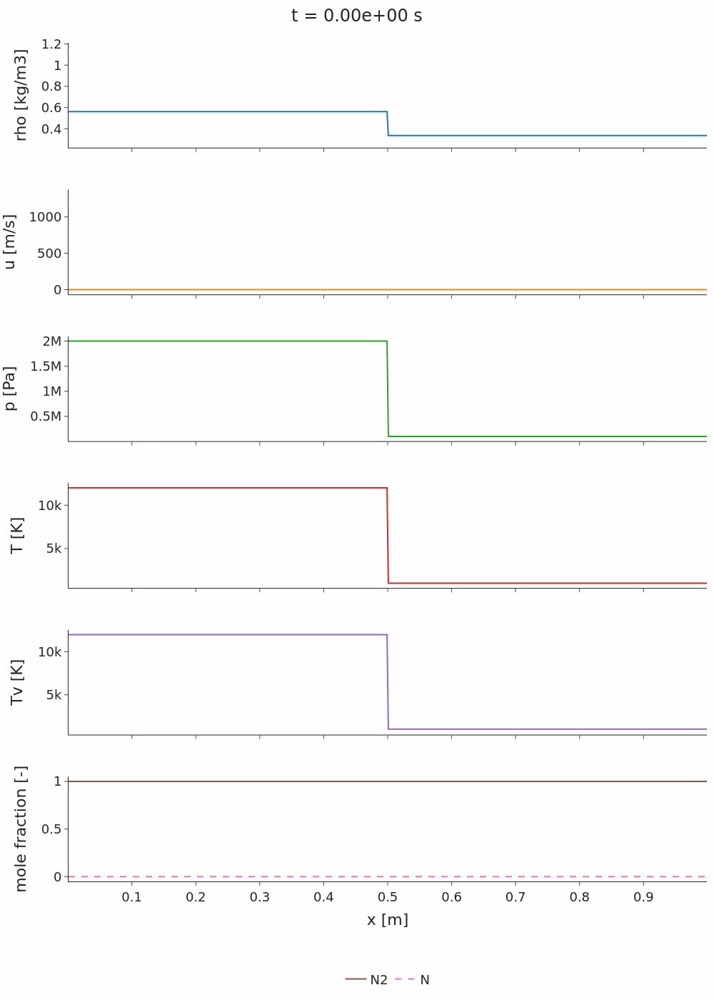

Physical duration: 0.000156016 s
Target GIF duration: 5 s
Time scaling factor: 32048.1
Playback fps: 20.8
Saved 105 frames to /home/hhoechter/tum/jaxfluids_internship/experiments/shock_tube_1d_williams/shock_tube_1d_williams_transient.gif


In [ ]:
from io import BytesIO
from pathlib import Path
from PIL import Image
from IPython.display import Image as IPyImage, display
import jax
import jax.numpy as jnp
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- user input ---
gif_downsample = 300  # use every Nth saved snapshot (1 = all)
last_index = None  # set to an int to stop at that snapshot index
gif_duration_s = 5.0  # total playback duration of the GIF
gif_scale = 1
gif_path = Path(
    "/home/hhoechter/tum/jaxfluids_internship/experiments/hypersonic_shock_tube_1d/shock_tube_1d_williams_transient.gif"
)
# ------------------

max_index = int(U_hist.shape[0]) - 1 if last_index is None else min(int(last_index), int(U_hist.shape[0]) - 1)
snap_indices = list(range(0, max_index + 1, gif_downsample))
if snap_indices[-1] != max_index:
    snap_indices.append(max_index)

U_sub = U_hist[: max_index + 1 : gif_downsample]
t_sub = t_hist[: max_index + 1 : gif_downsample]
base_last_index = int(np.arange(0, max_index + 1, gif_downsample)[-1])
if base_last_index != max_index:
    U_sub = jnp.concatenate([U_sub, U_hist[max_index : max_index + 1]], axis=0)
    t_sub = jnp.concatenate([t_sub, t_hist[max_index : max_index + 1]], axis=0)

x_plot = np.array(x)
x_range = [float(x_plot.min()), float(x_plot.max())]


def _extract_prim(U, em):
    prim = extract_primitives_from_U(U, em)
    return prim.Y_s, prim.rho, prim.T, prim.Tv, prim.p


extract_fn = jax.jit(_extract_prim)
Y_all, rho_all, T_all, Tv_all, p_all = jax.vmap(extract_fn, in_axes=(0, None))(
    U_sub, eq_manager
)
u_all = U_sub[:, :, eq_manager.species.n_species] / rho_all

rho_all = np.array(rho_all)
u_all = np.array(u_all)
p_all = np.array(p_all)
T_all = np.array(T_all)
Tv_all = np.array(Tv_all)
Y_all = np.array(Y_all)
t_all = np.array(t_sub)

dt_frames = np.diff(t_all)
physical_duration = float(t_all[-1] - t_all[0]) if len(t_all) > 1 else 0.0
if len(dt_frames) == 0 or physical_duration <= 0.0:
    fps = 1.0
    time_scale = 1.0
    frame_durations_ms = [max(1, int(round(1000.0 * gif_duration_s)))]
else:
    time_scale = gif_duration_s / physical_duration
    fps = (len(t_all) - 1) / gif_duration_s
    frame_durations_ms = np.maximum(
        1, np.round(1000.0 * dt_frames * time_scale).astype(int)
    ).tolist()
    frame_durations_ms.append(frame_durations_ms[-1])

profile_colors = {
    "rho": "#1f77b4",
    "u": "#ff7f0e",
    "p": "#2ca02c",
    "T": "#d62728",
    "Tv": "#9467bd",
}


def _make_range(vals, pad_frac=0.05):
    vmin = float(np.min(vals))
    vmax = float(np.max(vals))
    if np.isclose(vmin, vmax):
        pad = 1.0 if np.isclose(vmin, 0.0) else 0.05 * abs(vmin)
    else:
        pad = pad_frac * (vmax - vmin)
    return [vmin - pad, vmax + pad]


y_ranges = {
    "Y": _make_range(Y_all),
    "rho": _make_range(rho_all),
    "u": _make_range(u_all),
    "p": _make_range(p_all),
    "T": _make_range(T_all),
    "Tv": _make_range(Tv_all),
}

_ax_x = dict(title_font=dict(size=22), tickfont=dict(size=18), tickangle=0)
_ax_y = dict(title_font=dict(size=22), tickfont=dict(size=18))


def _make_frame_figure(k):
    fig = make_subplots(
        rows=6,
        cols=1,
        shared_xaxes=True,
        vertical_spacing=0.05,
    )

    fig.add_trace(
        go.Scatter(
            x=x_plot,
            y=rho_all[k],
            mode="lines",
            line=dict(color=profile_colors["rho"]),
            showlegend=False,
        ),
        row=1,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=x_plot,
            y=u_all[k],
            mode="lines",
            line=dict(color=profile_colors["u"]),
            showlegend=False,
        ),
        row=2,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=x_plot,
            y=p_all[k],
            mode="lines",
            line=dict(color=profile_colors["p"]),
            showlegend=False,
        ),
        row=3,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=x_plot,
            y=T_all[k],
            mode="lines",
            line=dict(color=profile_colors["T"]),
            showlegend=False,
        ),
        row=4,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=x_plot,
            y=Tv_all[k],
            mode="lines",
            line=dict(color=profile_colors["Tv"]),
            showlegend=False,
        ),
        row=5,
        col=1,
    )

    for s, name in enumerate(species_names):
        fig.add_trace(
            go.Scatter(
                x=x_plot,
                y=Y_all[k, :, s],
                mode="lines",
                name=name,
                showlegend=True,
                line=dict(dash="solid" if s == 0 else "dash"),
            ),
            row=6,
            col=1,
        )

    fig.update_layout(
        template="simple_white",
        title=dict(
            text=f"t = {float(t_all[k]):.2e} s",
            x=0.5,
            xanchor="center",
            font=dict(size=24),
        ),
        width=1000,
        height=1400,
        margin=dict(t=60, b=100, l=80, r=10),
        xaxis={**_ax_x, "range": x_range},
        xaxis2={**_ax_x, "range": x_range},
        xaxis3={**_ax_x, "range": x_range},
        xaxis4={**_ax_x, "range": x_range},
        xaxis5={**_ax_x, "range": x_range},
        xaxis6={**_ax_x, "title_text": "x [m]", "range": x_range},
        yaxis={**_ax_y, "title_text": "rho [kg/m3]", "range": y_ranges["rho"]},
        yaxis2={**_ax_y, "title_text": "u [m/s]", "range": y_ranges["u"]},
        yaxis3={**_ax_y, "title_text": "p [Pa]", "range": y_ranges["p"]},
        yaxis4={**_ax_y, "title_text": "T [K]", "range": y_ranges["T"]},
        yaxis5={**_ax_y, "title_text": "Tv [K]", "range": y_ranges["Tv"]},
        yaxis6={**_ax_y, "title_text": "mole fraction [-]", "range": y_ranges["Y"]},
        legend=dict(
            font=dict(size=18),
            x=0.5,
            y=-0.10,
            xanchor="center",
            yanchor="top",
            borderwidth=1,
            bordercolor="white",
            orientation="h",
        ),
    )
    return fig


frames = []
for k in range(len(t_all)):
    fig_k = _make_frame_figure(k)
    png_bytes = fig_k.to_image(format="png", scale=gif_scale)
    frame = Image.open(BytesIO(png_bytes)).convert("P", palette=Image.ADAPTIVE)
    frames.append(frame)
    del fig_k, png_bytes, frame

frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=frame_durations_ms,
    loop=0,
)

display(IPyImage(filename=str(gif_path)))
print(f"Physical duration: {physical_duration:.6g} s")
print(f"Target GIF duration: {gif_duration_s:.6g} s")
print(f"Time scaling factor: {time_scale:.6g}")
print(f"Playback fps: {fps:.6g}")
print(f"Saved {len(frames)} frames to {gif_path}")
